In [ ]:
# PyCaretとは
# 公式ページ https://pycaret.org/

# 1,短いコードで機械学習ができる
# 2,自動化 (AutoML)
# 3,オープンソース
# 4,scikit-learnや他の機械学習パッケージのwrapper

# Agenda
# 1,回帰
# 2,分類
# 3,クラスタリング

# 他にも，異常検出(anomaly detection)，
# 自然言語処理(natural language processing: NLP)，
# アソシエーション・ルール・マイニングが含まれている．

In [ ]:
!pip install pycaret #すべてのパッケージをインストールするなら !pip install pycaret[full]
from pycaret.utils import enable_colab
enable_colab()

#回帰

In [ ]:
# 広告による売り上げの予測
# 広告のデータ http://logopt.com/data/Advertising.csv を用いる．
# テレビ(TV)，ラジオ(Radio)，新聞(Newspaper)への広告から売り上げ(Sales)を予測する．

import pandas as pd #まずはpandasモジュールを準備する．
df = pd.read_csv('http://logopt.com/data/Advertising.csv', index_col =0) #0行目をインデックスにする．
df.tail()

# 独立変数（特徴ベクトル）X は TV, Radio, Newspaperの列，従属変数（ターゲット） y は Salesの列

#PyCaretの基本手順

In [3]:
# 手順１： setup(データフレーム）で前処理,準備をする． 引数 target でターゲットの列を指定． 引数 session_id で乱数の種を指定．

# 手順２： compare_modelsでモデルの比較を行う． 引数 fold で交差検証用のデータの分割数を指定． 
# 返値は最良の評価値のモデルインスタンス．（もしくはcreate_modelでモデルを生成する．）

# 注意： 遅い計算機で実行する際には，計算時間がかかるモデルを除いておくと良い．
# 引数excludeで除きたいモデルのリストを入れる． たとえば， compare_models(exclude = ['catboost']) とするとCatBoostを除いてモデルの比較を行ってくれる．

# 手順３： predict_modelで予測を行う．

from pycaret.regression import *   #回帰関連の関数のインポート
reg = setup(df, target = "Sales", session_id=123)

# TV = Numeric
# Radio = Numeric
# Newpaper = Numeric
# Sales = Label
# で良い場合はenterを押す。そうしたらいろんな前処理をしてくれる

,Description,Value
0,session_id,123
1,Target,Sales
2,Original Data,"(200, 4)"
3,Missing Values,False
4,Numeric Features,3
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(139, 3)"


In [4]:
# 次に複数の回帰モデルを回して比較する
best_model = compare_models(fold=5) # fold=交差検証の分割数
best_model

# 順番にいろんなモデルが実行されて良い順に並ぶ(決定係数順で並んでいる,R2)
# ここではExtra Trees Regressorが一番良い制度が出ている

# Extra Trees Regressor - ランダムに分割してアンサンブルする決定木ベースの手法
# Extra Trees Regressor - 勾配boosting

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.4636,0.4248,0.6334,0.9837,0.0705,0.0523,0.448
gbr,Gradient Boosting Regressor,0.6601,0.7945,0.8653,0.9704,0.0910,0.0709,0.056
rf,Random Forest Regressor,0.7123,0.8845,0.9210,0.9667,0.0945,0.0750,0.490
ada,AdaBoost Regressor,0.9116,1.3416,1.1366,0.9485,0.1020,0.0903,0.090
dt,Decision Tree Regressor,0.9474,1.4913,1.2042,0.9418,0.1032,0.0836,0.018
lightgbm,Light Gradient Boosting Machine,1.1357,2.4086,1.5262,0.9037,0.1636,0.1345,0.118
knn,K Neighbors Regressor,1.3162,3.1928,1.7806,0.8757,0.1345,0.1183,0.072
lasso,Lasso Regression,1.3792,3.3050,1.8048,0.8697,0.1819,0.1597,0.018
en,Elastic Net,1.3775,3.3151,1.8066,0.8692,0.1830,0.1604,0.018
lr,Linear Regression,1.3750,3.3262,1.8082,0.8686,0.1845,0.1613,0.644


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)

In [ ]:
best_model_results = pull() #結果をデータフレームとして得る．
best_model_results.to_csv("best_model.csv")


In [ ]:
# 回帰モデル
# No.	略称	回帰モデル	概要
# 1	et	Extra Trees Regressor - ランダムに分割してアンサンブルする決定木ベースの手法
# 2	gbr	Gradient Boosting Regressor	- 勾配ブースティング法
# 3	rf	Random Forest Regressor	- ランダム森（ブートストラップによるランダムサンプリングと決定木のアンサンブル）
# 4	xgboost	Extreme Gradient Booing	- xgブースト （勾配ブースティング法に正則化を追加）
# 5	catboost	CatBoost Regressor	- カテゴリー変数の扱いに工夫を入れた勾配ブースティング法

# 6	ada	AdaBoost Regressor - 適応型の勾配ブースティング法
# 7	dt	Decision Tree Regressor	- 決定木
# 8	lightgbm	Light Gradient Boosting Machine	- 勾配ブースティング法の軽量版
# 9	knn	K Neighbors Regressor - k-近傍法
# 10 lasso	Lasso Regression - Lasso回帰（正則化を入れた線形回帰）

# 11 en	Elastic Net	- Elastic Net（正則化を入れた線形回帰）
# 12 lar Least Angle Regression	- 予測値と教師データの偏差と相関が大きい特徴量を1つずつ追加していく方法
# 13 lr	Linear Regression - 線形回帰
# 14 ridge	Ridge Regression - リッジ回帰（正則化を入れた線形回帰）
# 15 br	Bayesian Ridge	- ベイズリッジ回帰

# 16 huber	Huber Regressor	- Huber回帰
# 17 omp	Orthogonal Matching Pursuit	- 貪欲に特徴量を1つずつ追加していく方法
# 18 llar	Lasso Least Angle Regression - LassoにLeast Angle Regressionを適用して特徴量選択
# 19 par	Passive Aggressive Regressor - オンライン型の学習

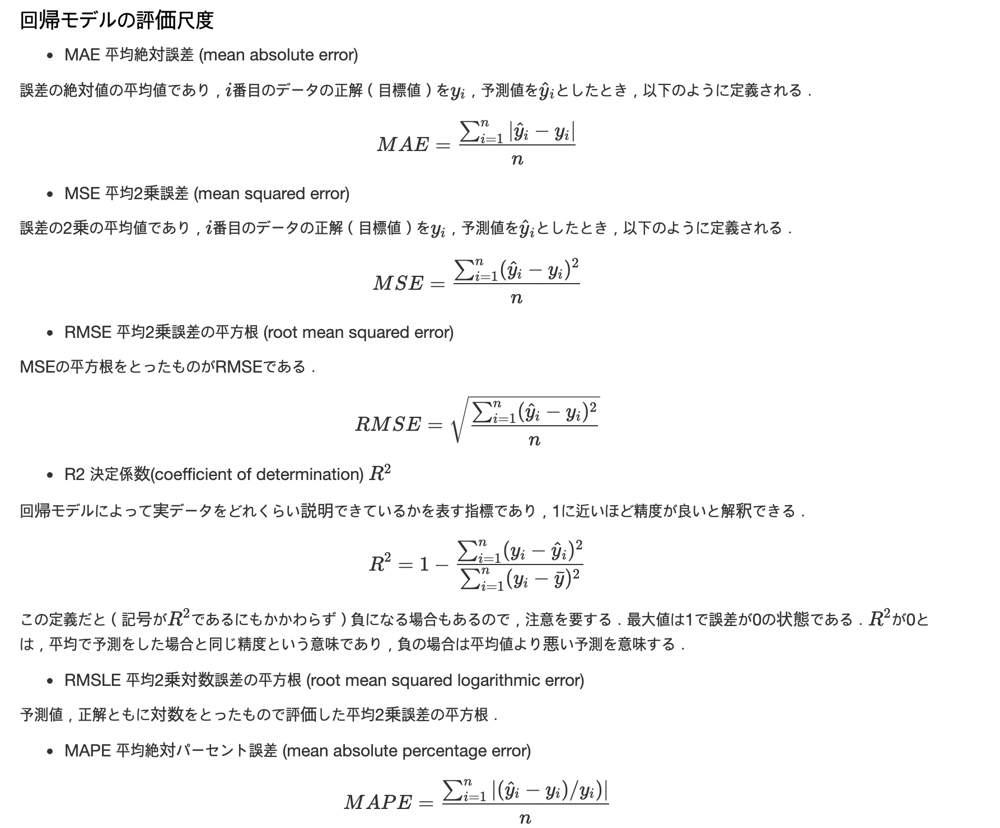

In [6]:
best_model
# ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
#                     max_depth=None, max_features='auto', max_leaf_nodes=None,
#                     max_samples=None, min_impurity_decrease=0.0,
#                     min_impurity_split=None, min_samples_leaf=1,
#                     min_samples_split=2, min_weight_fraction_leaf=0.0,
#                     n_estimators=100, n_jobs=-1, oob_score=False,
#                     random_state=123, verbose=0, warm_start=False)

# ()内は設定されたパラメータ,あとでチューニングも可能

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)

In [7]:
best_model_results = pull() #結果(の表を)をデータフレームとして得る,pull()
best_model_results.to_csv("best_model.csv") #csv形式で保存

## 予測

In [5]:
predict_model(best_model) #labelは誤差

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.3772,0.2647,0.5145,0.9898,0.0328,0.028


,TV,Radio,Newspaper,Sales,Label
0,199.800003,3.100000,34.599998,11.4,11.080
1,80.199997,0.000000,9.200000,8.8,9.137
2,74.699997,49.400002,45.700001,14.7,13.937
3,44.700001,25.799999,20.600000,10.1,9.836
4,147.300003,23.900000,19.100000,14.6,14.633
...,...,...,...,...,...
56,66.099998,5.800000,24.200001,8.6,9.231
57,276.899994,48.900002,41.799999,27.0,25.154
58,120.500000,28.500000,14.200000,14.2,14.470
59,239.300003,15.500000,27.299999,15.7,15.422


#可視化の基本手順(回帰)

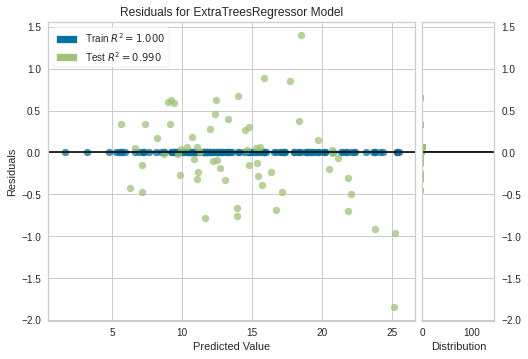

In [8]:
# 可視化（回帰）
# 手順１： plot_model(モデルインスタンス)で描画する．引数plotで描画の種類を指定する．既定値は残差プロット．
# 手順２：interpret_model（モデルインスタンス:解釈のための関数）で，結果の解釈を可視化する．

# plot_modelの引数plotの種類

# ‘residuals’: 残差プロット（既定値）
# ‘error’ : 誤差プロット
# ‘cooks’: Cookの距離プロット（外れ値をみる）
# ‘feature': 特徴重要度プロットp
# ‘learning’: 学習曲線
# ‘vc’: 検証曲線
# ‘manifold’: 次元削減を行い特徴を2次元に射影した図
# ‘parameter’: モデルのパラメータを表で表示
# ‘tree’: 決定木の図示（木ベースの場合のみ）

plot_model(best_model)

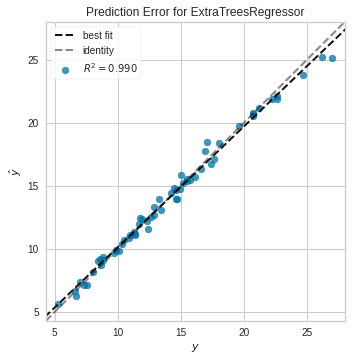

In [9]:
plot_model(best_model, plot = 'error') #実際のyとy^をプロットしてズレを見る

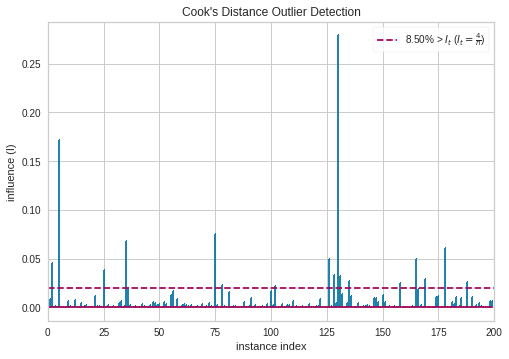

In [10]:
plot_model(best_model, plot = 'cooks') #外れ値を見たい時に用いる

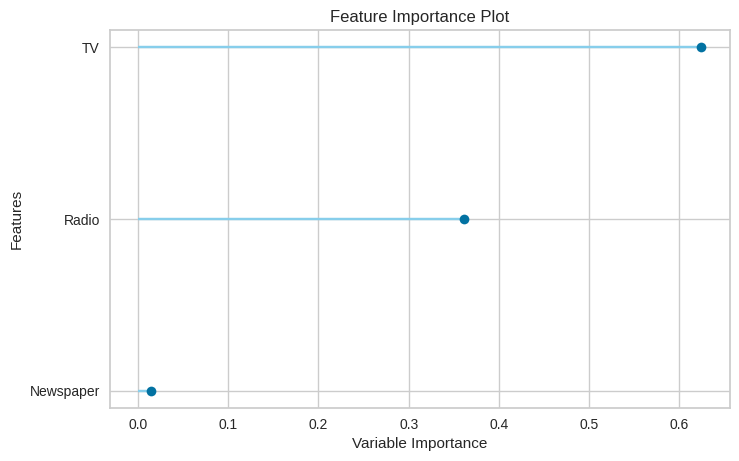

In [11]:
plot_model(best_model, plot = 'feature') #特徴重要度をプロットしたもの,TVが一番重要

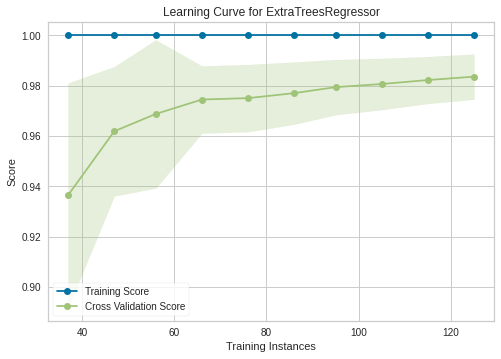

In [12]:
plot_model(best_model, plot = 'learning') #学習曲線

In [ ]:
plot_model(best_model, plot = 'vc') #validation card - 検証データに関する学習曲線

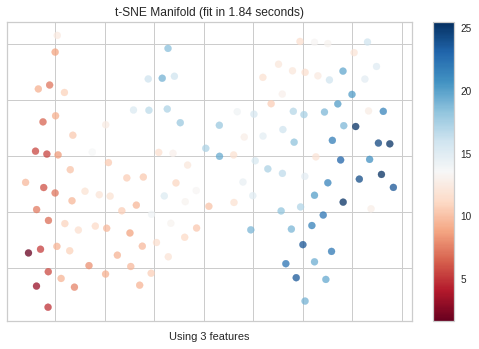

In [13]:
plot_model(best_model, plot = 'manifold') #特徴ベクトルを色別に分けて(ターゲットに分けて),特徴ベクトルを２次元にt-sneで二次元に落とす

In [14]:
plot_model(best_model, plot = 'parameter') #bestmodelのパラメータ表示

,Parameters
bootstrap,False
ccp_alpha,0.0
criterion,mse
max_depth,None
max_features,auto
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_impurity_split,None
min_samples_leaf,1


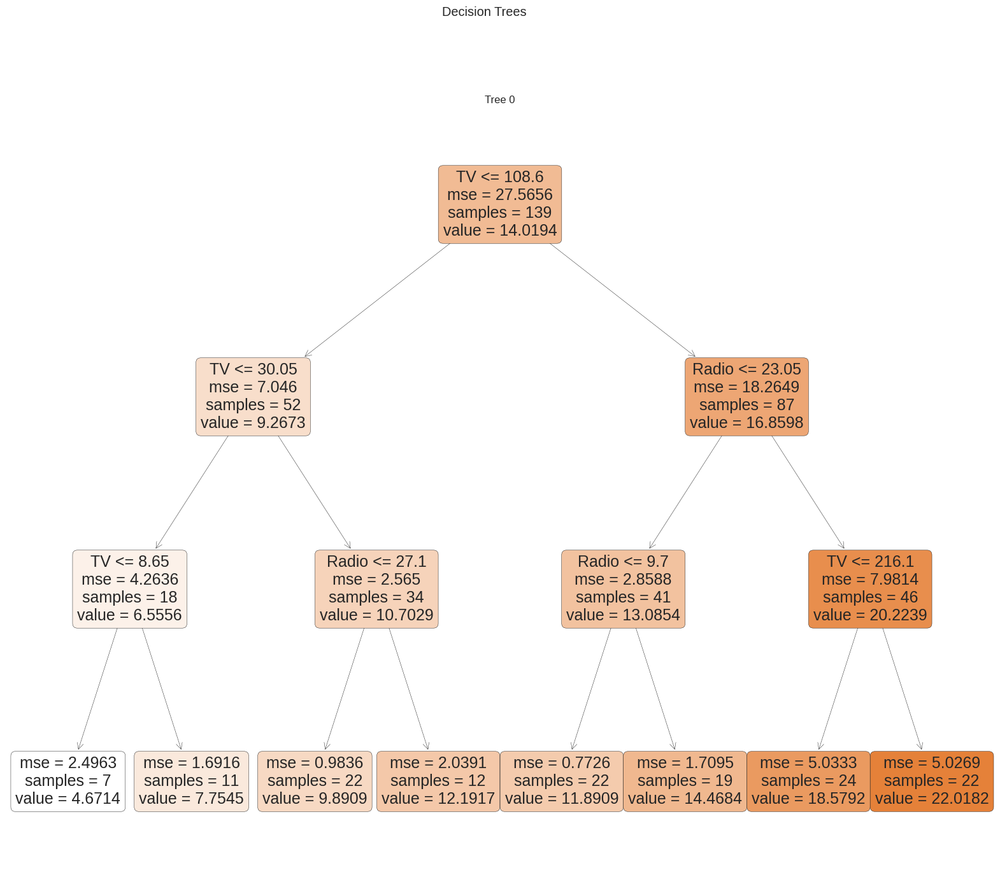

In [15]:
# 小さな（深さ3の）決定木 (dt) のモデルを作って可視化する．

dt = create_model('dt', max_depth=3) #('dt = 決定木', max_depth=決定木作るときのパラメータ max_depth=3 - 木の深さを3)
plot_model(dt, plot = 'tree') #plotモデルで可視化

#モデルの解釈

In [19]:
# interpret_model関数は，SHAP値 (Shapley value)を計算する．

# interpret_modelの引数plotの種類

# 1,‘summary’: 各特徴のSHAP値がターゲットに与える影響を表した図 （既定値）
# 2,‘correlation’: 特徴とSHAP値の相関図
# 3,‘reason’: 個々のデータに対するSHAP値

In [22]:
pip install shap

     |████████████████████████████████| 564 kB 5.1 MB/s 



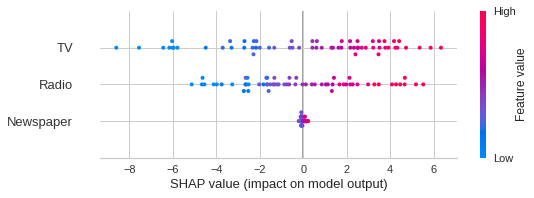

In [24]:
# interpretを使う場合はpip install shapでshapをインストールする必要がある
interpret_model(best_model) #↓が出るはず
#TVはプラスの影響がある

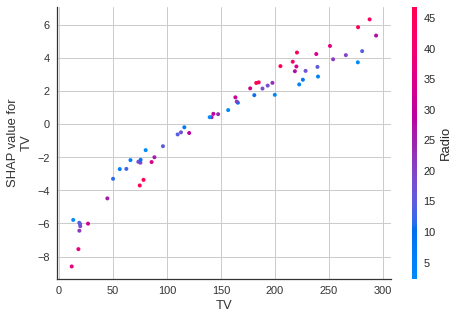

In [25]:
interpret_model(best_model, plot = 'correlation') #相関

In [26]:
interpret_model(best_model, plot = 'reason', observation = 10) #11.31になった理由を見れる

In [27]:
# 問題 (SAT,GPA)
# http://logopt.com/data/SATGPA.csv データを用いて，2種類のSATの成績からGPAを予測せよ．
# データをそのまま使うと'MathSAT'列と'VerbalSAT'列をカテゴリー変数としてしまうので，浮動小数点数に変換しておく．
gpa = pd.read_csv("http://logopt.com/data/SATGPA.csv", index_col=0, dtype={'MathSAT':float, 'VerbalSAT':float})
gpa.head()

,MathSAT,VerbalSAT,GPA
1,580.0,420.0,2.90
2,670.0,530.0,2.83
3,680.0,540.0,2.90
4,630.0,640.0,3.30
5,620.0,630.0,3.61


In [ ]:
# 問題（住宅価格）
# http://logopt.com/data/Boston.csv のBostonの住宅データを用いて回帰分析を行え．

# medvが住宅の価格で，他のデータ（犯罪率や人口など）から予測する．

In [ ]:
# 問題（車の燃費）
# http://logopt.com/data/Auto.csv の車の燃費のデータを用いて回帰分析を行え．

# データの詳細については，

# https://vincentarelbundock.github.io/Rdatasets/doc/ISLR/Auto.html

# を参照せよ．

# 最初の列が燃費（mpg: Mile Per Gallon)であり，これを他の列の情報を用いて予測する．最後の列は車名なので無視して良い．


In [ ]:
# 問題（コンクリートの強度）
# 以下のコンクリートの強度の例題に対して，strength列の強度を他の列の情報から，線形回帰を用いて推定せよ．

concrete = pd.read_csv("http://logopt.com/data/concrete.csv")
concrete.head()

In [ ]:
# 問題（シェアバイク）
# 以下のシェアバイクのデータに対して，riders列が利用者数を，線形回帰を用いて推定せよ．ただし，date列とcasual列は除いてから回帰を行え．
# また，なぜcasual列を含めて推定をしないのか考察せよ．

bikeshare = pd.read_csv("http://logopt.com/data/bikeshare.csv")
bikeshare.head()


# ダイヤモンドの価格の予測（カテゴリー変数）

In [28]:
# http://logopt.com/data/Diamond.csv からダイアモンドの価格データを読み込み，回帰による予測を行う．
# 列は ["carat","colour","clarity","certification","price"] であり，他の情報から価格(price)の予測を行え．
# カラット(carat)以外の列は情報が文字列として保管されている．これはカテゴリー変数とよばれる．
# PyCaretでは，前処理関数setupで，自動的に変換してくれるので，手順は前とまったく同じである．

import pandas as pd
diamond = pd.read_csv('http://logopt.com/data/Diamond.csv', index_col=0)
diamond.head()

# colourやclarity,certificationがカテゴリー関数なので数値に変換する必要がある

,carat,colour,clarity,certification,price
1,0.30,D,VS2,GIA,1302
2,0.30,E,VS1,GIA,1510
3,0.30,G,VVS1,GIA,1510
4,0.30,G,VS1,GIA,1260
5,0.31,D,VS1,GIA,1641


In [29]:
# setupで前処理をする
reg = setup(diamond, target = 'price', session_id=123)

,Description,Value
0,session_id,123
1,Target,price
2,Original Data,"(308, 5)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(215, 15)"


In [30]:
best_model = compare_models(fold=5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,260.3273,3.379700e+05,510.4212,0.9707,0.0916,0.0608,0.470
lightgbm,Light Gradient Boosting Machine,326.7242,3.633391e+05,555.4182,0.9679,0.1385,0.0925,0.096
gbr,Gradient Boosting Regressor,283.0419,3.886520e+05,568.6945,0.9657,0.0892,0.0601,0.052
rf,Random Forest Regressor,330.3894,4.172219e+05,594.7542,0.9631,0.1007,0.0711,0.492
dt,Decision Tree Regressor,372.9116,4.820978e+05,640.5102,0.9574,0.1172,0.0832,0.016
llar,Lasso Least Angle Regression,491.8227,4.958225e+05,677.2238,0.9542,0.3945,0.1944,0.044
huber,Huber Regressor,479.5457,4.953647e+05,676.0879,0.9542,0.4670,0.1853,0.098
lasso,Lasso Regression,496.8779,4.980862e+05,681.3048,0.9537,0.3819,0.2013,0.022
br,Bayesian Ridge,498.8744,4.991179e+05,682.5451,0.9536,0.3795,0.2023,0.032
lr,Linear Regression,498.3806,4.995791e+05,683.0280,0.9535,0.3833,0.2037,0.912


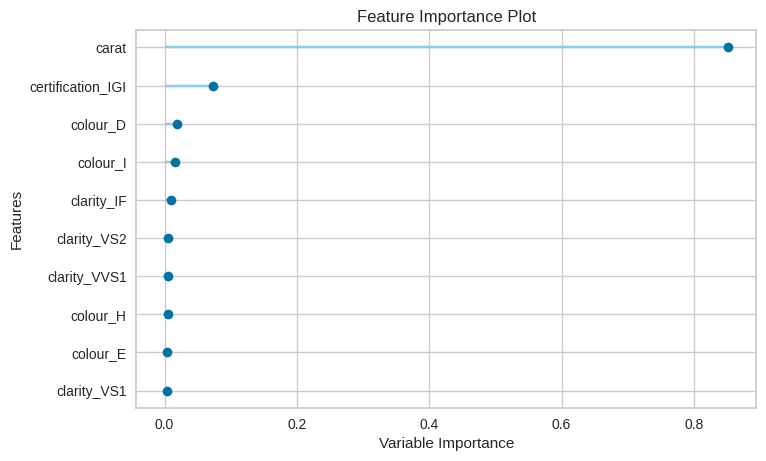

In [31]:
plot_model(best_model, plot="feature")
# caratが一番大事

In [ ]:
# 問題（車の価格）
# http://logopt.com/data/carprice.csv から車の価格データを読み込み，回帰による予測を行え．

# データの詳細は https://vincentarelbundock.github.io/Rdatasets/doc/DAAG/carprice.html にある．

# 車種(Type)，100マイル走る際のガロン数（gpm100），都市部での1ガロンあたりの走行距離（MPGcity），高速道路での１ガロン当たりの走行距離（MPGhighway）から，価格(Price)を予測せよ．

In [ ]:
# 問題（チップ）
# 以下のtipsデータに対して回帰を用いてもらえるチップの額(tip)を予測せよ．

import seaborn as sns
tips = sns.load_dataset('tips')
tips.head()

#分類(スパムの判定)

In [32]:
# メールがスパム（spam；迷惑メイル）か否かを判定する例題を用いる．
# https://archive.ics.uci.edu/ml/datasets/spambase

# 様々な数値情報から，is_spam列が 1 （スパムでない）か， 0 （スパム）かを判定する．

import pandas as pd
spam = pd.read_csv("http://logopt.com/data/spam.csv")
spam.head()


,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_;,char_freq_(,char_freq_[,char_freq_!,char_freq_$,char_freq_#,capital_run_length_average,capital_run_length_longest,capital_run_length_total,is_spam
0,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,0.21,0.79,0.65,0.21,0.14,0.14,0.07,0.28,3.47,0.00,1.59,0.0,0.43,0.43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.07,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.132,0.0,0.372,0.180,0.048,5.114,101,1028,1
1,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,0.38,0.45,0.12,0.00,1.75,0.06,0.06,1.03,1.36,0.32,0.51,0.0,1.16,0.06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.06,0.0,0.0,0.12,0.0,0.06,0.06,0.0,0.0,0.01,0.143,0.0,0.276,0.184,0.010,9.821,485,2259,1
2,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.137,0.0,0.137,0.000,0.000,3.537,40,191,1
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.135,0.0,0.135,0.000,0.000,3.537,40,191,1
4,0.00,0.00,0.00,0.0,1.85,0.00,0.00,1.85,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.223,0.0,0.000,0.000,0.000,3.000,15,54,1


In [33]:
# is_spam列が従属変数（ターゲット）y になり，それ以外の列が独立変数（特徴ベクトル）X になる

from pycaret.classification import *
clf = setup(data = spam, target = 'is_spam', session_id=123)

,Description,Value
0,session_id,123
1,Target,is_spam
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(4600, 58)"
5,Missing Values,False
6,Numeric Features,57
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [35]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9553,0.9864,0.9369,0.9478,0.9422,0.9057,0.9059,0.302
et,Extra Trees Classifier,0.9528,0.9851,0.9337,0.9446,0.9390,0.9005,0.9007,0.758
rf,Random Forest Classifier,0.9494,0.9846,0.9186,0.9499,0.9339,0.8929,0.8933,0.978
gbc,Gradient Boosting Classifier,0.9431,0.9824,0.9098,0.9423,0.9256,0.8796,0.8801,1.410
ada,Ada Boost Classifier,0.9329,0.9763,0.9089,0.9182,0.9133,0.8586,0.8589,0.409
lr,Logistic Regression,0.9273,0.9701,0.8882,0.9223,0.9048,0.8460,0.8466,1.055
dt,Decision Tree Classifier,0.9074,0.9059,0.8970,0.8702,0.8829,0.8064,0.8072,0.109
lda,Linear Discriminant Analysis,0.8875,0.9516,0.7860,0.9129,0.8444,0.7572,0.7627,0.071
ridge,Ridge Classifier,0.8866,0.0000,0.7820,0.9143,0.8426,0.7549,0.7608,0.025
nb,Naive Bayes,0.8139,0.9457,0.9521,0.6893,0.7994,0.6342,0.6636,0.053


In [ ]:
# 分類モデル
# No.	略称	分類モデル	概要
# 1	et	Extra Trees Classifier -ランダムに分割してアンサンブルする決定木ベースの手法
# 2	gbc	Gradient Boosting Classifier - 勾配ブースティング法
# 3	xgboost	Extreme Gradient Boosting - xgブースト （勾配ブースティング法に正則化を追加）
# 4	rf	Random Forest Classifier - ランダム森（ブートストラップによるランダムサンプリングと決定木のアンサンブル）
# 5	catboost	CatBoost Classifier	- カテゴリー変数の扱いに工夫を入れた勾配ブースティング法
# 6	ada	AdaBoost Classifier	- 適応型の勾配ブースティング法
# 7	dt	Decision Tree Classifier - 決定木
# 8	lightgbm	Light Gradient Boosting Machine	- 勾配ブースティング法の軽量版
# 9	knn	K Neighbors Classifier	- k-近傍法
# 10	lda	Linear Discriminant Analysis - 線形判別分析（すべてのクラスで同じ正規分布を仮定）
# 11	qda	Quadratic Discriminant Analysis	- 2次判別分析（各クラスで異なる正規分布を仮定）
# 12	lr	Logistic Regression	- ロジスティック回帰
# 13	ridge	Ridge Classifier - リッジ分類
# 14	nb	Naive Bayes	- 単純ベイズ
# 15	svm	SVM - Linear Kernel	- サポートベクトルマシン（線形カーネル）

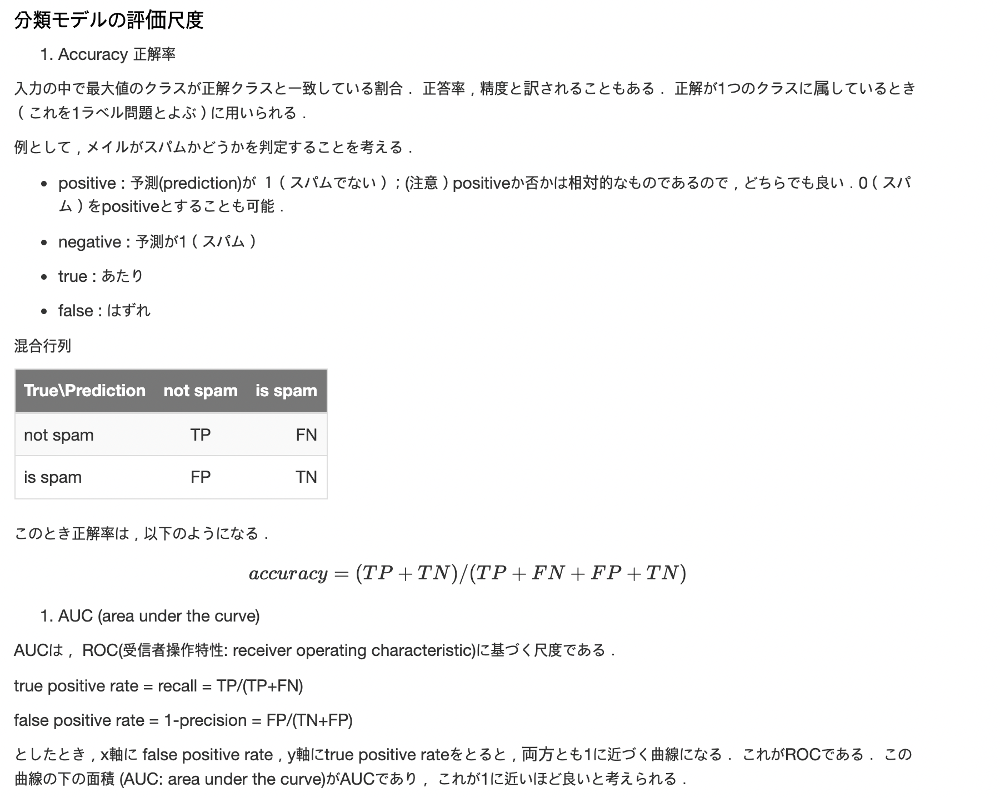

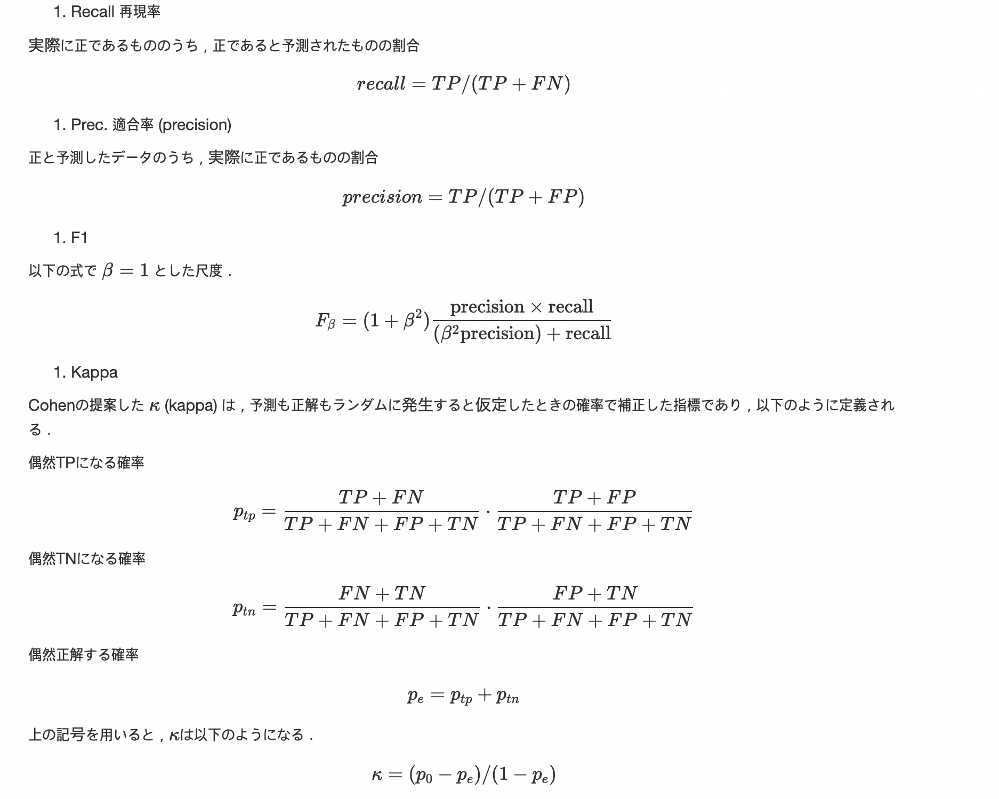

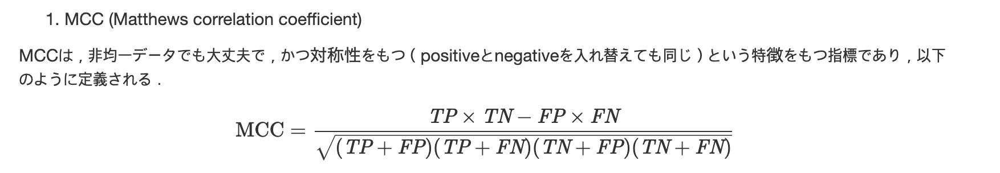

#可視化の基本手順(分類)

In [ ]:
# plot_model(モデルインスタンス)で描画する．引数plotで描画の種類を指定する． interpret_modelは回帰と同じ．
# plot_model関数の引数plotの種類（回帰と同じものは省略）

# ‘auc’: ROC曲線の下の面積 （既定値）
# ‘threshold’: 識別閾値（discrimination threshold）を変えたときの評価尺度の変化
# ‘pr’ : 適合率（precision）と再現率（recall）を表示
# ‘confusion_matrix’: 混合行列
# ‘error’: クラスごとの誤差を表示
# ‘class_report’: クラスごとの評価尺度のヒートマップ
# ‘boundary’: 決定の境界の図示
# ‘calibration’: キャリブレーション（検量）曲線の図示
# ‘dimension’ - Dimension Learning
# ‘gain’ - データの一部（パーセンテージ）でどれだけクラスを予測できたか(これをgainと呼ぶ）を表した図
# ‘lift’ - 上のgainとベースライン（予測モデルを使わない場合）の比をプロットしたもの

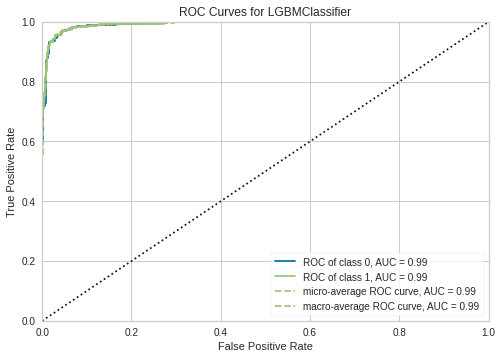

In [36]:
# ROC曲線
# ROC: 受信者操作特性（receiver operating characteristic)

# https://ja.wikipedia.org/wiki/受信者操作特性

# 閾値を1から0に変えると，recall (true positive rate) が増加し，precision (1-false positive rate) が減少する．

# x軸に false positive rate，y軸にtrue positive rateをとると，両方とも1に近づく曲線になる．

# 曲線の下の面積 (AUC: area under the curve) が評価尺度（大きいほど良い）になる．

# true positive rate = recall = TP/(TP+FN)
# false positive rate = 1-precision = FP/(TN+FP)

plot_model(best_model, plot = 'auc')

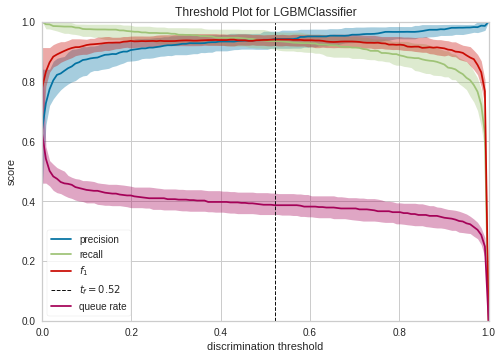

In [37]:
plot_model(best_model, plot = 'threshold') #閾値をどこで取るか

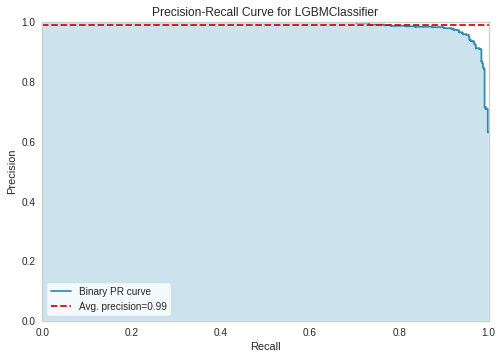

In [38]:
plot_model(best_model, plot = 'pr')

# 混合行列

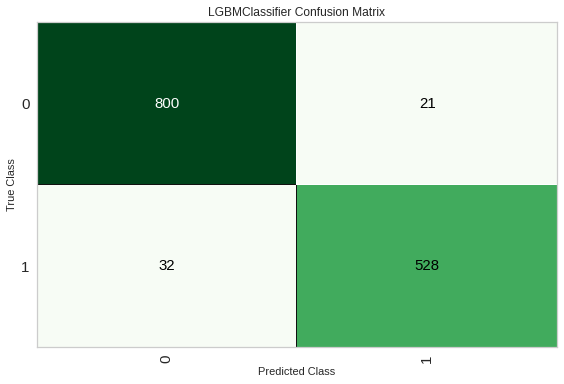

In [39]:
# 1,positive : 予測(prediction)が １（スパムでない）；(注意）positiveか否かは相対的なものであるので，どちらでも良い．0（スパム）をpositiveとすることも可能．
# 2,negative : 予測が1（スパム）
# 3,true : あたり
# 4,false : はずれ

plot_model(best_model, plot = 'confusion_matrix')

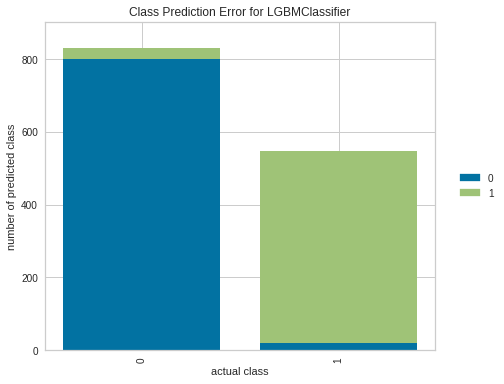

In [40]:
plot_model(best_model, plot='error')

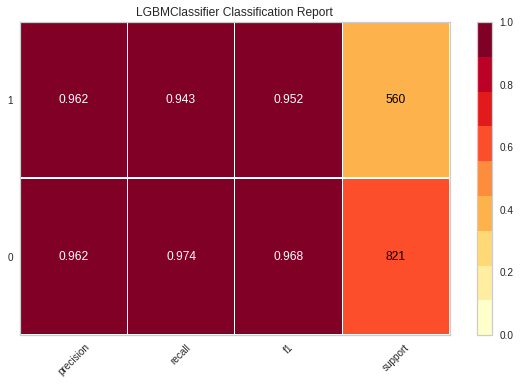

In [41]:
plot_model(best_model, plot='class_report')

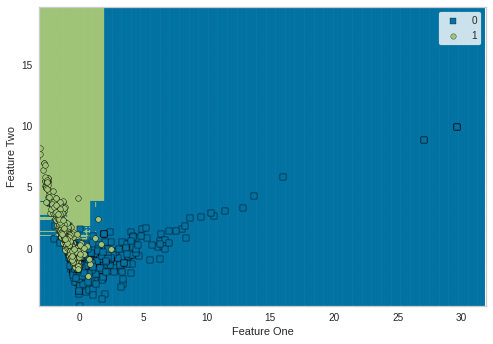

In [42]:
plot_model(best_model, plot='boundary')

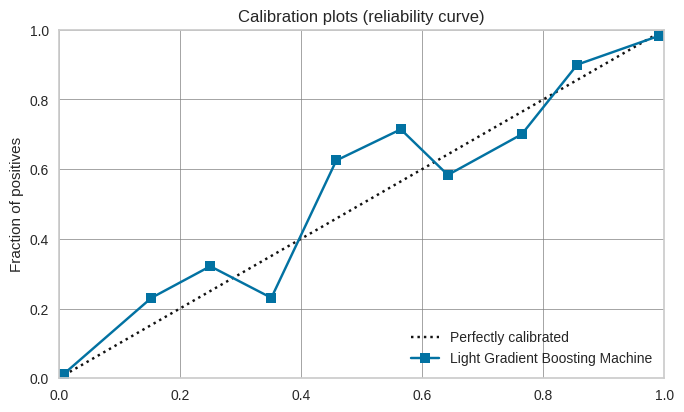

In [43]:
plot_model(best_model, plot='calibration')

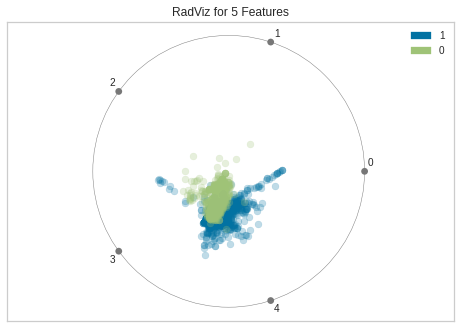

In [44]:
plot_model(best_model, plot='dimension')

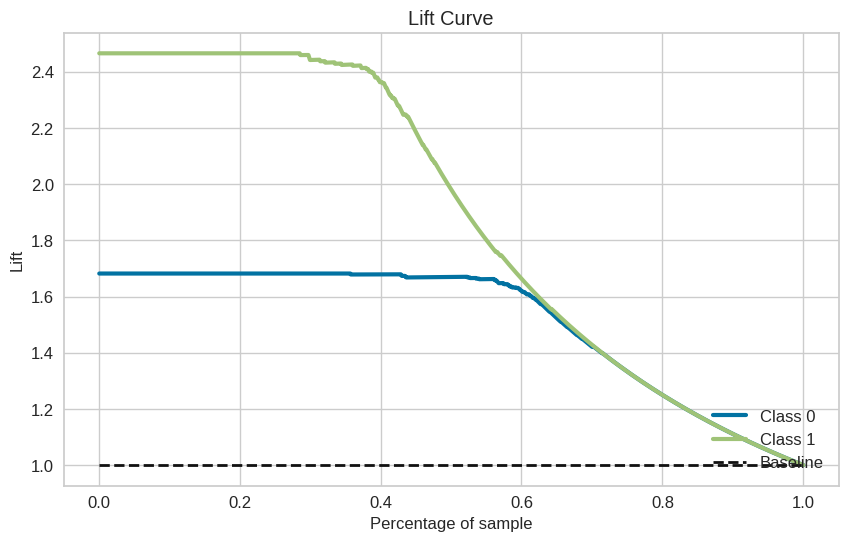

In [45]:
plot_model(best_model, plot='lift')

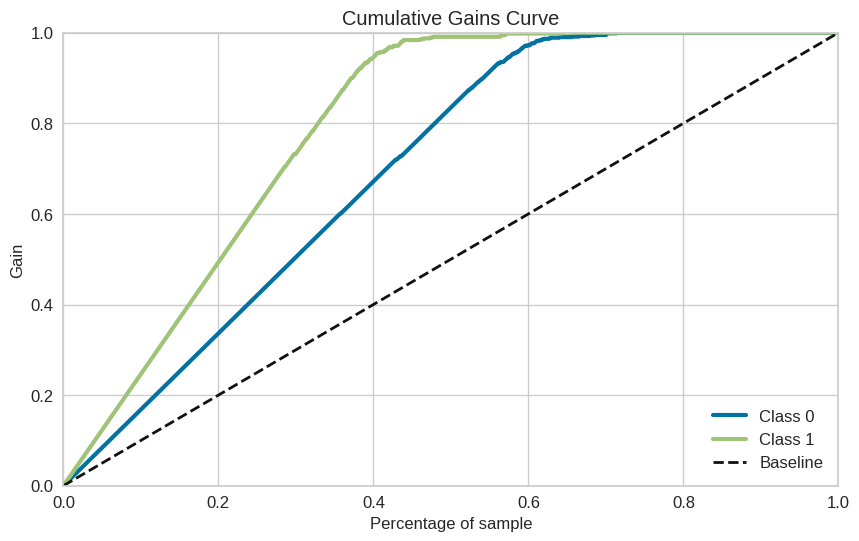

In [46]:
plot_model(best_model, plot='gain')

#iris（アヤメ）のデータ

In [47]:
# 2値分類だけでなく，3種類以上のものの分類もできる．
# 以下ではアヤメのデータを用いて分類を行い，3種類のアヤメを分類する．

import plotly.express as px
iris = px.data.iris()
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


In [48]:
clf = setup(data = iris, target = 'species', ignore_features=["species_id"], session_id=123)

,Description,Value
0,session_id,123
1,Target,species
2,Target Type,Multiclass
3,Label Encoded,"setosa: 0, versicolor: 1, virginica: 2"
4,Original Data,"(150, 6)"
5,Missing Values,False
6,Numeric Features,4
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [49]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.9809,0.9969,0.9833,0.9857,0.9809,0.9715,0.9739,0.016
knn,K Neighbors Classifier,0.9800,0.9830,0.9806,0.9800,0.9800,0.9697,0.9697,0.117
qda,Quadratic Discriminant Analysis,0.9709,0.9969,0.9750,0.9782,0.9709,0.9566,0.9602,0.015
lr,Logistic Regression,0.9609,0.9921,0.9611,0.9622,0.9596,0.9403,0.9422,0.346
nb,Naive Bayes,0.9609,0.9938,0.9611,0.9652,0.9605,0.9407,0.9432,0.017
gbc,Gradient Boosting Classifier,0.9609,0.9782,0.9611,0.9723,0.9579,0.9402,0.9476,0.206
dt,Decision Tree Classifier,0.9509,0.9616,0.9500,0.9598,0.9479,0.9249,0.9309,0.015
et,Extra Trees Classifier,0.9509,0.9890,0.9528,0.9532,0.9509,0.9258,0.9269,0.443
rf,Random Forest Classifier,0.9409,0.9875,0.9417,0.9422,0.9396,0.9100,0.9119,0.468
ada,Ada Boost Classifier,0.9409,0.9895,0.9417,0.9467,0.9391,0.9100,0.9146,0.096


#可視化

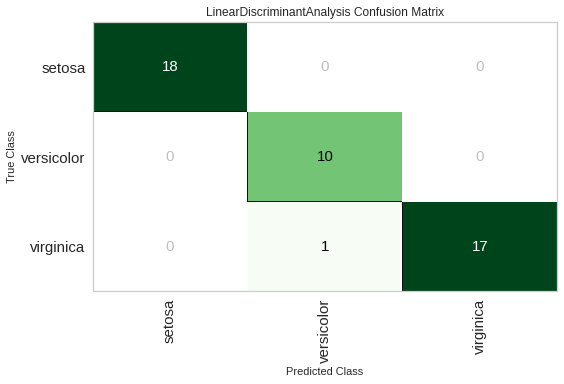

In [50]:
# 以下の2つの可視化を追加
# 1,どの特徴が重要かを可視化するRadViz
# 2,重要と思われる2つの特徴に対して，ロジスティック回帰の分類がどのように行われたかを示すDecisionViz（決定の境界を示す）

# スパムと同じ可視化
# 1,混合行列 (ConfusionMatrix)
# 2,分類レポート (ClassificationReport)
# 3,ROC曲線 (ROCAUC)

# 3値以上の場合には，閾値を変化させる可視化はできないことに注意

plot_model(best_model, plot = 'confusion_matrix')
#よく当たる

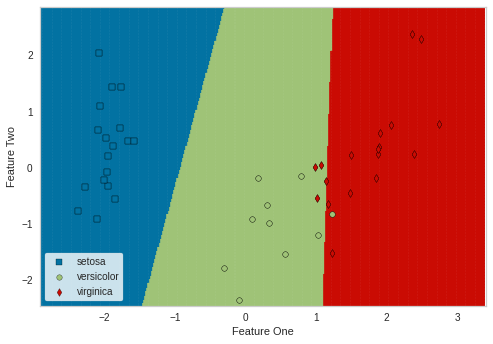

In [51]:
plot_model(best_model, plot='boundary')

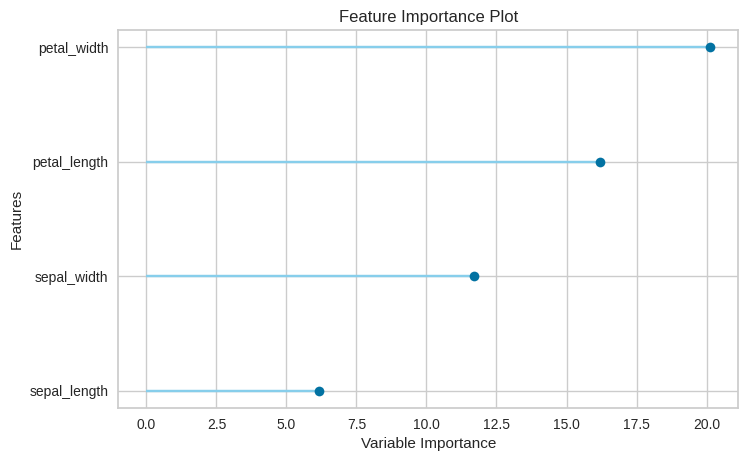

In [52]:
plot_model(best_model, plot='feature')

# 毒キノコの判定

In [53]:
# ここでは，データから毒キノコか否かを判定する.
# target列がターゲット（従属変数）であり，edibleが食用，poisonousが毒である．
# 他の列のデータもすべて数値ではない．
# PyCaretでは，自動的に前処理をしてくれるので，手順はまったく同じである．

mashroom = pd.read_csv("http://logopt.com/data/mashroom.csv")
mashroom.head()

,target,shape,surface,color
0,edible,convex,smooth,yellow
1,edible,bell,smooth,white
2,poisonous,convex,scaly,white
3,edible,convex,smooth,gray
4,edible,convex,scaly,yellow


# 前処理

In [54]:
# setupで前処理を行うとき，引数log_experimentをTrueにしておくと，実験結果を保存してくれる． また，引数 experiment_name で実験名を指定し， 引数 log_plots をTrueにすることによって，図を保存する．

from pycaret.classification import *
clf = setup(data = mashroom, target = 'target', session_id=123, log_experiment = True, experiment_name = 'mashroom_1', log_plots=True)

# log_experiment = True - 実験結果を保存
# experiment_name = 'mashroom_1' - その名前をmashroom_1とする
# log_plots=Trueも取る

,Description,Value
0,session_id,123
1,Target,target
2,Target Type,Binary
3,Label Encoded,"edible: 0, poisonous: 1"
4,Original Data,"(8123, 4)"
5,Missing Values,False
6,Numeric Features,0
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


In [56]:
# ベスト５の手法を保存
best_5 = compare_models(n_select = 5)
# n_select = 一番良いもので5つだけ持ってくる

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6993,0.8015,0.7196,0.6777,0.6977,0.3991,0.4002,0.363
lightgbm,Light Gradient Boosting Machine,0.6973,0.8062,0.6515,0.7013,0.6744,0.3925,0.3943,0.113
dt,Decision Tree Classifier,0.6952,0.8050,0.6456,0.7000,0.6708,0.3880,0.3898,0.034
et,Extra Trees Classifier,0.6952,0.8052,0.6456,0.7000,0.6708,0.3880,0.3898,0.596
rf,Random Forest Classifier,0.6943,0.8050,0.6507,0.6967,0.6723,0.3866,0.3879,0.688
knn,K Neighbors Classifier,0.6774,0.7534,0.6803,0.6699,0.6676,0.3547,0.3610,0.287
lr,Logistic Regression,0.6627,0.7183,0.6657,0.6461,0.6557,0.3252,0.3255,0.143
ridge,Ridge Classifier,0.6623,0.0000,0.6650,0.6459,0.6552,0.3245,0.3247,0.032
lda,Linear Discriminant Analysis,0.6623,0.7155,0.6650,0.6459,0.6552,0.3245,0.3247,0.049
ada,Ada Boost Classifier,0.6590,0.7140,0.6522,0.6453,0.6485,0.3174,0.3176,0.226


# パラメータチューニング

In [57]:
# ベスト5の方法のパラメータをチューニングする．並列化をしてくれている
tuned = [tune_model(i) for i in best_5]

# それぞれのモデルのパラメータを良い感じにチューニングしてくれる
# チューニングをするとaccuracyが少しだけ良くなる

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7469,0.8330,0.8686,0.6879,0.7677,0.4979,0.5143
1,0.6784,0.7806,0.8029,0.6304,0.7063,0.3621,0.3752
2,0.6503,0.7619,0.8175,0.6005,0.6924,0.3085,0.3285
3,0.6907,0.7773,0.8182,0.6410,0.7188,0.3862,0.4005
4,0.6678,0.7839,0.7891,0.6236,0.6966,0.3406,0.3522
5,0.6924,0.7897,0.8582,0.6344,0.7295,0.3911,0.4155
6,0.6496,0.7464,0.7883,0.6050,0.6846,0.3056,0.3193
7,0.7113,0.8269,0.8613,0.6519,0.7421,0.4281,0.4498
8,0.6954,0.7898,0.8467,0.6391,0.7284,0.3968,0.4174
9,0.6778,0.7671,0.8139,0.6282,0.7091,0.3613,0.3766


# Bagging

In [58]:
# Bagging (Bootstrap aggregating) はアンサンブル法の一種である． 
# 繰り返しを許してサンプリング(bootstrap) し， 結果の多数決 (aggregating)をとることによって，元の手法の分散を減らし，過剰適合を減らすモデルを作れる
# Bagging = bootstrap

bagged = [ensemble_model(i) for i in tuned]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7452,0.8301,0.8796,0.6827,0.7687,0.4948,0.5147
1,0.6854,0.7859,0.8321,0.6316,0.7181,0.3770,0.3956
2,0.6503,0.7581,0.8175,0.6005,0.6924,0.3085,0.3285
3,0.6907,0.7821,0.8182,0.6410,0.7188,0.3862,0.4005
4,0.6643,0.7804,0.7891,0.6200,0.6944,0.3338,0.3458
5,0.6924,0.7859,0.8582,0.6344,0.7295,0.3911,0.4155
6,0.6496,0.7450,0.8139,0.6011,0.6915,0.3068,0.3259
7,0.7113,0.8247,0.8613,0.6519,0.7421,0.4281,0.4498
8,0.7007,0.7951,0.8759,0.6383,0.7385,0.4082,0.4366
9,0.6778,0.7651,0.8139,0.6282,0.7091,0.3613,0.3766


# Blending

In [59]:
# 異なる手法の多数決をとる方法がblendingである(5つのモデルをブレンドする)
blender = blend_models(estimator_list = tuned)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7381,0.8485,0.7263,0.7289,0.7276,0.4755,0.4755
1,0.7012,0.7914,0.7299,0.6757,0.7018,0.4034,0.4046
2,0.6626,0.7778,0.7117,0.6331,0.6701,0.3272,0.3295
3,0.7170,0.8090,0.7491,0.6913,0.7190,0.4350,0.4364
4,0.7047,0.8199,0.7491,0.6754,0.7103,0.4109,0.4132
5,0.7047,0.8184,0.7818,0.6656,0.7191,0.4121,0.4181
6,0.6725,0.7762,0.7153,0.6447,0.6782,0.3467,0.3486
7,0.7324,0.8461,0.7482,0.7118,0.7295,0.4651,0.4656
8,0.6937,0.8018,0.7409,0.6634,0.7000,0.3890,0.3915
9,0.6831,0.7800,0.7409,0.6506,0.6928,0.3684,0.3717


In [60]:
# Blendingの実験結果を表示
!mlflow ui

# httpから入れるはずだが今回は無理

[2022-02-02 05:40:41 +0000] [16993] [INFO] Handling signal: int

Aborted!
[2022-02-02 05:40:41 +0000] [16996] [INFO] Worker exiting (pid: 16996)
[2022-02-02 05:40:42 +0000] [16993] [INFO] Shutting down: Master


In [ ]:
# 問題（クレジットカード）
# 以下のクレジットカードのデフォルトの判定データに対して分類を行え．

# default列にデフォルトか否かの情報があり，他の列の情報を用いて分類せよ．

# ただし，データ数が多いので，引数に exclude=["catboost"] を入れて CatBoostを除いてモデルを比較せよ．

credit = pd.read_csv("http://logopt.com/data/credit.csv")
credit.tail()

In [ ]:
# 問題（部屋）
# 以下の部屋が使われているか否かを判定するデータに対して分類を行え．

# occupancy列が部屋が使われているか否かを表す情報であり，これをdatetime列以外の情報から分類せよ．

occupancy = pd.read_csv("http://logopt.com/data/occupancy.csv")
occupancy.tail()


In [ ]:
# 問題（タイタニック）
# titanicデータに対して分類を行い，死亡確率の推定を行え．

# ただし， モデルの比較の際には， fold=5, exclude=["ridge"] を引数で与えよ．

titanic = pd.read_csv("http://logopt.com/data/titanic.csv")
titanic.head()

In [ ]:
# 問題（胸部癌）
# http://logopt.com/data/cancer.csv にある胸部癌か否かを判定するデータセットを用いて分類を行え．

# 最初の列diagnosisが癌か否かを表すものであり，'M'が悪性（malignant），'B'が良性（benign）を表す．

cancer = pd.read_csv("http://logopt.com/data/cancer.csv", index_col=0)
cancer.head()

#クラスタリング

In [61]:
# UCI機械学習レポジトリのワインに関するデータセットを用いてクラスタリングを解説する．
# 使用するのは k-平均法である．
# 元データはこちらに格納されている．

# http://logopt.com/data/wine.data
# 列名は https://archive.ics.uci.edu/ml/datasets/Wine で解説されている．

import pandas as pd
L = [ 'Alcohol', 'Malic','Ash', 'Alcalinity', 'Magnesium', 'Phenols', 'Flavanoids', 'Nonflavanoid',
     'Proanthocyanins', 'Color', 'Hue', 'OD280', 'OD315', 'Proline']
wine = pd.read_csv('http://logopt.com/data/wine.data',names=L)
wine.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoid,Proanthocyanins,Color,Hue,OD280,OD315,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [62]:
from pycaret.clustering import *
cluster = setup(wine)

,Description,Value
0,session_id,5224
1,Original Data,"(178, 14)"
2,Missing Values,False
3,Numeric Features,13
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(178, 16)"
9,CPU Jobs,-1


In [63]:
# クラスタリングもcreate_model関数で生成する．引数modelでモデルの種類を設定する．

# 引数modelの種類 （すべてscikit-learnを利用している）：

# ‘kmeans’: k-平均法（各点の重心までの距離の和を最小化）
# ‘ap’: Affinity Propagation
# ‘meanshift’: Mean shift Clustering
# ‘sc’: スペクトラル・クラスタリング（低次元に射影してからkk-平均法）
# ‘hclust’: 階層的クラスタリング法
# ‘dbscan’: DBSCAN (Density-Based Spatial Clustering)
# ‘optics’: DBSCANの一般化
# ‘birch’ : Birch Clustering
# ‘kmodes’: kk-Modes Clustering

# クラスターの数は，引数num_clusters（既定値は4）で与える．

kmeans = create_model('kmeans', num_clusters=4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.562,708.0526,0.5444,0,0,0


In [64]:
# 得られたクラスタリングを元のデータフレームに書き込む．

kmean_results = assign_model(kmeans) #1に近いと良い
kmean_results.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoid,Proanthocyanins,Color,Hue,OD280,OD315,Proline,Cluster
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,Cluster 3
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,Cluster 3
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,Cluster 1
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,Cluster 1
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,Cluster 2


# クラスタリングの評価尺度

In [66]:
# Silhouette: シルエット値； クラスター内の平均距離aと最も近い別のクラスターとの平均距離bに対して (b - a) / max(a, b)と定義される． 他のクラスターと離れているとき1に近くなる．
# Calinski-Harabasz: クラスター間の分散とクラスター内の分散の比を合計したもの；大きいほどクラスターが分離している．
# Davies-Bouldin：クラスター内と最も類似しているクラスター間の類似度の比の平均；小さいほどクラスターが分離している．
# Homogeneity: 均質性尺度；正解が必要；0から1の値ととり，1に近いほど良い．
# Rand Index： 2つのクラスターに対して，正解と同じ割当になっている割合を表す尺度；-1から1の値をとり，1のとき正解と同じ．
# Completeness： 正解のクラスターに含まれるデータが，同じクラスターに含まれる割合；0から1の値をとり，1に近いほど良い．

ap = create_model('ap')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.518,1323.6567,0.5247,0,0,0


In [65]:
meanshift = create_model('meanshift')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5025,454.0492,0.5562,0,0,0


In [67]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2803,3.3691,0.4477,0,0,0


In [68]:
hclust = create_model('hclust')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5606,670.5942,0.5536,0,0,0


In [69]:
dbscan = create_model('dbscan') #Bug?

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


In [70]:
optics = create_model('optics')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0752,33.4027,4.3619,0,0,0


In [71]:
birch = create_model('birch')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5606,670.5942,0.5536,0,0,0


In [72]:
kmodes = create_model('kmodes')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0731,80.7988,26.5829,0,0,0


#可視化（クラスタリング）

In [73]:
# plot_model（モデルインスタンス）で可視化する．

# Plotlyの図は Jupyterlabでは表示されない． save引数で保存してから， Jupyterlabの拡張機能 jupyterlab-chart-editor をインストールし，別ウィンドウで生成されたhtmlファイルを開く（Trust HTMLを押す）．

# plot_model関数の引数plotの種類

# ‘cluster’: クラスターを主成分分析 (PCA) によって2次元に表示した図 (Plotly)
# ‘tsne’: クラスターをt-SNE(t-Distributed Stochastic Neighbor Embedding)によって３次元に表示した図(Plotly)
# ‘elbow’: 分割数を表すパラメータ kk の適正化 （エルボー法）の図
# ‘silhouette’ - シルエット係数 (クラスター内の平均距離aと最も近い別のクラスターとの平均距離bに対して (b - a) / max(a, b)と定義される；他のクラスターと離れているとき1に近くなる）の図示
# ‘distance’: クラスター間の距離の図示
# ‘distribution’ -クラスターに含まれるデータ数の分布図(Plotly)

plot_model(kmeans, save=True) # save=True - 保存

'cluster'

In [74]:
plot_model(kmeans, plot="tsne", save=True)

'tsne'

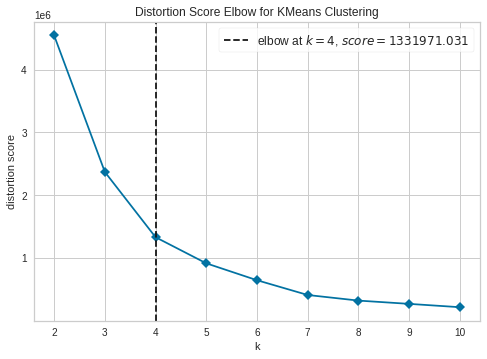

In [75]:
plot_model(kmeans, plot = 'elbow')

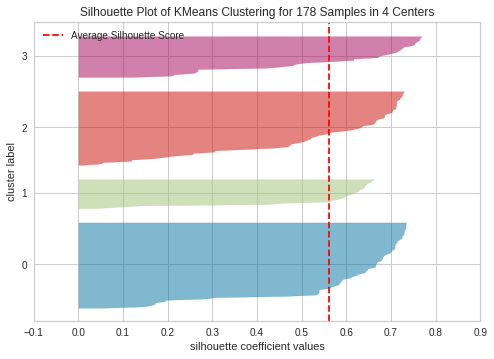

In [76]:
plot_model(kmeans, plot = 'silhouette')

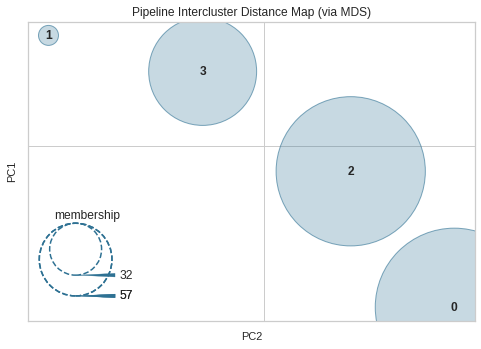

In [77]:
plot_model(kmeans, plot = 'distance')

In [78]:
plot_model(kmeans, plot = 'distribution', save=True)

'distribution'

In [ ]:
# 問題（アヤメ）
# irisのデータセットの各データを kk-平均法を用いて3つのクラスターに分けて可視化せよ． また，他の手法を1つ選んでクラスタリングと可視化をし， kk-平均法と比較せよ．

iris = px.data.iris()
iris.head()